<a href="https://colab.research.google.com/github/CelikAbdullah/deep-learning-notebooks/blob/main/Deep%20Reinforcement%20Learning/Actor-Critic/SAC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Libraries

In [1]:
!pip install pybullet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.5/80.5 MB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pybullet: filename=pybullet-3.2.5-cp310-cp310-linux_x86_64.whl size=99850166 sha256=68ee128b01bb1b3b63787ec131ccd69a4b0e234176a9a802c8cdc4985e7a1d52
  Stored in directory: /root/.cache/pip/wheels/6b/fa/1a/c315a5133f0c9bf202a6daa5d70891120e7fe403e06e3407cc
Successfully built pybullet


In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import pybullet
import pybullet_envs
import gym
import time
from itertools import count
from torch.distributions import Normal

/usr/local/lib/python3.10/dist-packages/gym/envs/registration.py:440: UserWarning: WARN: The `registry.env_specs` property along with `EnvSpecTree` is deprecated. Please use `registry` directly as a dictionary instead.
  logger.warn(


# Action Value Network

In [3]:
class QValueNetwork(nn.Module):
  def __init__(self,
               input_dim,
               output_dim,
               hidden_dims=(32,32),
               activation_fc=F.relu):
    super(QValueNetwork, self).__init__()
    self.activation_fc = activation_fc

    # input layer
    self.input_layer = nn.Linear(input_dim + output_dim, hidden_dims[0])

    # hidden layer(s)
    self.hidden_layers = nn.ModuleList()
    for i in range(len(hidden_dims)-1):
      hidden_layer = nn.Linear(hidden_dims[i], hidden_dims[i+1])
      self.hidden_layers.append(hidden_layer)

    # output layer
    self.output_layer = nn.Linear(hidden_dims[-1], 1)


    device = "cpu"
    if torch.cuda.is_available():
      device = "cuda:0"

    self.device = torch.device(device)
    self.to(self.device)

  def _format(self, state, action):
    '''
    Format the inputs (if necessary).
    '''
    x, u = state, action

    if not isinstance(x, torch.Tensor):
      x = torch.tensor(x, device=self.device, dtype=torch.float32)
      x = x.unsqueeze(0)

    if not isinstance(u, torch.Tensor):
      u = torch.tensor(u, device=self.device, dtype=torch.float32)
      u = u.unsqueeze(0)

    return x, u

  def forward(self, state, action):
    '''
    Forward pass.
    '''

    # bring state & action into right format
    x, u = self._format(state, action)

    # pass state & action to the input layer
    #x = self.activation_fc(self.input_layer(torch.cat((x, u), dim=1)))
    x = self.activation_fc(torch.nn.functional.linear(torch.cat((x, u), dim=1), self.input_layer.weight.clone(), self.input_layer.bias))

    # pass output of input layer to the hidden layer(s)
    for i, hidden_layer in enumerate(self.hidden_layers):
      #x = self.activation_fc(hidden_layer(x))
      x = self.activation_fc(torch.nn.functional.linear(x, hidden_layer.weight.clone(), hidden_layer.bias))

    # pass output of hidden layer(s) to the output layer
    #x = self.output_layer(x)
    x = torch.nn.functional.linear(x, self.output_layer.weight.clone(), self.output_layer.bias)

    return x

  def load(self, experiences):
    states, actions, new_states, rewards, is_terminals = experiences
    states = torch.from_numpy(states).float().to(self.device)
    actions = torch.from_numpy(actions).float().to(self.device)
    new_states = torch.from_numpy(new_states).float().to(self.device)
    rewards = torch.from_numpy(rewards).float().to(self.device)
    is_terminals = torch.from_numpy(is_terminals).float().to(self.device)
    return states, actions, new_states, rewards, is_terminals

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Policy Network

In [4]:
class PolicyNetwork(nn.Module):
  def __init__(self,
               input_dim,
               action_bounds,
               log_std_min=-20,
               log_std_max=2,
               hidden_dims=(32,32),
               activation_fc=F.relu,
               entropy_lr=0.001):

    super(PolicyNetwork, self).__init__()
    self.activation_fc = activation_fc
    self.env_min, self.env_max = action_bounds

    self.log_std_min = log_std_min
    self.log_std_max = log_std_max

    # input layer
    self.input_layer = nn.Linear(input_dim, hidden_dims[0])

    # hidden layers
    self.hidden_layers = nn.ModuleList()
    for i in range(len(hidden_dims)-1):
      hidden_layer = nn.Linear(hidden_dims[i], hidden_dims[i+1])
      self.hidden_layers.append(hidden_layer)

    # hidden layers connect to the two streams
    # one stream represents the mean of the action and
    # the other stream the log standard deviation
    self.output_layer_mean = nn.Linear(hidden_dims[-1], len(self.env_max))
    self.output_layer_log_std = nn.Linear(hidden_dims[-1], len(self.env_max))

    device = "cpu"
    if torch.cuda.is_available():
      device = "cuda:0"

    self.device = torch.device(device)
    self.to(self.device)

    # convert min & max to a PyTorch tensor
    self.env_min = torch.tensor(self.env_min,device=self.device, dtype=torch.float32)
    self.env_max = torch.tensor(self.env_max,device=self.device, dtype=torch.float32)

    self.nn_min = F.tanh(torch.Tensor([float('-inf')])).to(self.device)
    self.nn_max = F.tanh(torch.Tensor([float('inf')])).to(self.device)
    self.rescale_fn = lambda x: (x - self.nn_min) * (self.env_max - self.env_min) / (self.nn_max - self.nn_min) + self.env_min

    # calculate the target entropy heuristic H
    self.target_entropy = -np.prod(self.env_max.shape)
    # create log alpha
    self.logalpha = torch.zeros(1, requires_grad=True, device=self.device)
    # create an optimizer to optimize log alpha
    self.alpha_optimizer = optim.Adam([self.logalpha], lr=entropy_lr)

  def _format(self, state):
    '''
    Format the state (if necessary)
    '''
    x = state
    if not isinstance(x, torch.Tensor):
      x = torch.tensor(x, device=self.device, dtype=torch.float32)
      x = x.unsqueeze(0)

    return x

  def forward(self, state):
    '''
    Forward pass.
    '''
    # format the input variable
    x = self._format(state)
    # pass them through the whole network
    x = self.activation_fc(self.input_layer(x))

    for hidden_layer in self.hidden_layers:
      x = self.activation_fc(hidden_layer(x))

    # mean
    x_mean = self.output_layer_mean(x)
    # log std
    x_log_std = self.output_layer_log_std(x)
    # clamp the log std to -20 to 2 to control the std range to reasonable values
    x_log_std = torch.clamp(x_log_std, self.log_std_min, self.log_std_max)

    # return mean & log std
    return x_mean, x_log_std

  def full_pass(self, state, epsilon=1e-6):
    # perform forward pass
    mean, log_std = self.forward(state)
    # get a Normal distribution with those values
    pi_s = Normal(mean, log_std.exp())
    # use rsample() for the reparameterization trick
    pre_tanh_action = pi_s.rsample()
    # squash the action to be in range -1, 1
    tanh_action = torch.tanh(pre_tanh_action)
    # rescale to be the environment expected range
    action = self.rescale_fn(tanh_action)

    # we rescale the log probability
    log_prob = pi_s.log_prob(pre_tanh_action) - torch.log((1 - tanh_action.pow(2)).clamp(0, 1) + epsilon)
    log_prob = log_prob.sum(dim=1, keepdim=True)

    # rescale the mean
    return action, log_prob, self.rescale_fn(torch.tanh(mean))

  def _update_exploration_ratio(self, greedy_action, action_taken):
    env_min, env_max = self.env_min.cpu().numpy(), self.env_max.cpu().numpy()
    self.exploration_ratio = np.mean(abs((greedy_action - action_taken)/(env_max - env_min)))

  def _get_actions(self, state):
    mean, log_std = self.forward(state)
    action = self.rescale_fn(torch.tanh(Normal(mean, log_std.exp()).sample()))
    greedy_action = self.rescale_fn(torch.tanh(mean))
    random_action = np.random.uniform(low=self.env_min.cpu().numpy(),high=self.env_max.cpu().numpy())

    action_shape = self.env_max.cpu().numpy().shape
    action = action.detach().cpu().numpy().reshape(action_shape)
    greedy_action = greedy_action.detach().cpu().numpy().reshape(action_shape)
    random_action = random_action.reshape(action_shape)

    return action, greedy_action, random_action

  def select_random_action(self, state):
    action, greedy_action, random_action = self._get_actions(state)
    self._update_exploration_ratio(greedy_action, random_action)
    return random_action

  def select_greedy_action(self, state):
    action, greedy_action, random_action = self._get_actions(state)
    self._update_exploration_ratio(greedy_action, greedy_action)
    return greedy_action

  def select_action(self, state):
    action, greedy_action, random_action = self._get_actions(state)
    self._update_exploration_ratio(greedy_action, action)
    return action

# Replay Buffer

In [5]:
class ReplayBuffer():
  def __init__(self, max_size=10000, batch_size=64):
    # create the arrays
    self.ss_mem = np.empty(shape=(max_size), dtype=np.ndarray)
    self.as_mem = np.empty(shape=(max_size), dtype=np.ndarray)
    self.rs_mem = np.empty(shape=(max_size), dtype=np.ndarray)
    self.ps_mem = np.empty(shape=(max_size), dtype=np.ndarray)
    self.ds_mem = np.empty(shape=(max_size), dtype=np.ndarray)

    # set the max size
    self.max_size = max_size
    # set the batch size
    self.batch_size = batch_size
    # initialize the index variable
    self._idx = 0
    # initialize the size variable
    self.size = 0

  def store(self, sample):
    # extract the sample
    s, a, r, p, d = sample
    # put each component into its corresponding array
    self.ss_mem[self._idx] = s
    self.as_mem[self._idx] = a
    self.rs_mem[self._idx] = r
    self.ps_mem[self._idx] = p
    self.ds_mem[self._idx] = d

    # increment the index variable
    self._idx += 1
    # adjust the index variable
    self._idx = self._idx % self.max_size

    # increment the size variable
    self.size += 1
    # take the min
    self.size = min(self.size, self.max_size)

  def sample(self, batch_size=None):
    # set the batch size
    if batch_size == None:
      batch_size = self.batch_size

    # get random indices
    idxs = np.random.choice(self.size, batch_size, replace=False)

    # build experiences
    experiences = np.vstack(self.ss_mem[idxs]), \
                  np.vstack(self.as_mem[idxs]), \
                  np.vstack(self.rs_mem[idxs]), \
                  np.vstack(self.ps_mem[idxs]), \
                  np.vstack(self.ds_mem[idxs])

    # return experiences
    return experiences

  def __len__(self):
    return self.size

# SAC agent

SAC stands for "soft actor-critic". It is an off-policy algorithm similar to DDPG and TD3 but it trains stochastic policy as in REINFORCE, A3C, GAE and A2C instead of a deterministic policy as in DDPG and TD3.

In SAC, we use the following action-value function target:

$SAC^{target} = r + \gamma [min_n Q(s', \hat{a}'; \theta^{n,-}) - \alpha log \pi(\hat{a}' | s'; \phi)]$

We take the reward plus the discounted minimum value of the next state-action pair. The next actions $\hat{a}'$ are provided by the current policy network. We pass those state-next_action pairs to the target value network to retrieve the Q values. Finally, we subtract the weighted log probability. As you can see in SAC class, we train the action-value network doing MSE on this target.

In SAC, we use the following loss function for the policy network:

$J_\pi(\phi) = \mathbb{E}_{s \sim U(D), \hat{a} \sim \pi} [min_n Q(s, \hat{a}; \theta^n) - \alpha log \pi(\hat{a} | s; \phi)]$

We sample the state from the buffer and the action from the policy. We train the policy network by minimizing the negative of the loss function because we want the Q value minus the weighted log probability to be as high as possible.

$\alpha$ is the entropy coefficient that can be tuned automatically. We use the entropy $H$ to automatically optimize $\alpha$ so that there's no hyperparameter to tune.

$J(\alpha) = \mathbb{E}_{s \sim U(D), \hat{a} \sim \pi}[\alpha(H + log \pi(\hat{a}|s; \phi))]$

We get the state from the buffer and the action from the policy. We want both the weighted $H$ which is the target entropy heuristic and the log probability to be as high as possible which means we minimize the negative of this.

In [6]:
class SAC():

  def __init__(self,
               env,
               policy_model,
               policy_max_grad_norm,
               policy_optimizer,
               online_value_model_a,
               online_value_model_b,
               target_value_model_a,
               target_value_model_b,
               value_max_grad_norm,
               value_optimizer_a,
               value_optimizer_b,
               replay_buffer,
               warmup_batches,
               update_target_steps,
               tau,
               gamma,
               max_minutes,
               max_episodes,
               goal):

    # set the attributes
    self.env = env
    self.policy_model = policy_model
    self.policy_max_grad_norm = policy_max_grad_norm
    self.policy_optimizer = policy_optimizer
    self.online_value_model_a = online_value_model_a
    self.online_value_model_b = online_value_model_b
    self.target_value_model_a = target_value_model_a
    self.target_value_model_b = target_value_model_b
    self.value_max_grad_norm = value_max_grad_norm
    self.value_optimizer_a = value_optimizer_a
    self.value_optimizer_b = value_optimizer_b
    self.replay_buffer = replay_buffer
    self.warmup_batches = warmup_batches
    self.update_target_steps = update_target_steps
    self.tau = tau
    self.gamma = gamma
    self.max_minutes = max_minutes
    self.max_episodes = max_episodes
    self.goal = goal
    self.evaluation_scores = []

  def __interact(self, state):
    '''
    Interact with the environment.
    '''
    # define the number of samples
    min_samples = self.replay_buffer.batch_size * self.warmup_batches

    # replay buffer does not have enough samples
    if len(self.replay_buffer) < min_samples:
      # select random action
      action = self.policy_model.select_random_action(state)
    else:
      # otherwise, select action
      action = self.policy_model.select_action(state)

    # perform the action in the environment
    new_state, reward, is_terminal, info = self.env.step(action)
    # built-in timelimit of the environment
    is_truncated = 'TimeLimit.truncated' in info and info['TimeLimit.truncated']
    is_failure = is_terminal and not is_truncated
    # create the experience tuple & store it into the replay buffer
    experience = (state, action, reward, new_state, float(is_failure))

    return experience, new_state, is_terminal


  def __update_value_networks(self, tau=None):
    '''
    Update the weights of the target value networks.
    '''

    # set the tau value
    tau = self.tau if tau is None else tau

    # mix the weights of the networks target value model a and online value model a
    for target, online in zip(self.target_value_model_a.parameters(),
                              self.online_value_model_a.parameters()):
      target_ratio = (1.0 - tau) * target.data
      online_ratio = tau * online.data
      mixed_weights = target_ratio + online_ratio
      target.data.copy_(mixed_weights)

    # mix the weights of the networks target value model b and onlne value model b
    for target, online in zip(self.target_value_model_b.parameters(),
                              self.online_value_model_b.parameters()):
      target_ratio = (1.0 - tau) * target.data
      online_ratio = tau * online.data
      mixed_weights = target_ratio + online_ratio
      target.data.copy_(mixed_weights)


  def __optimize(self, experiences):
    '''
    Perform the optimization.
    '''
    # sample the states, actions, etc. from the replay buffer
    states, actions, rewards, next_states, is_terminals = experiences
    # we get the current actions â and the log probabilities of current states
    current_actions, logpi_s, _ = self.policy_model.full_pass(states)
    # compute target_alpha
    target_alpha = (logpi_s + self.policy_model.target_entropy).detach()
    # determine the alpha loss
    alpha_loss = -(self.policy_model.logalpha * target_alpha).mean()
    # perform standard backpropagations
    self.policy_model.alpha_optimizer.zero_grad()
    alpha_loss.backward()
    self.policy_model.alpha_optimizer.step()
    # get the alpha from the policy model
    alpha = self.policy_model.logalpha.exp()
    # get the Q values from the online value model 'a' and 'b' using the current actions â
    current_q_values_a = self.online_value_model_a(states, current_actions)
    current_q_values_b = self.online_value_model_b(states, current_actions)
    # determine the min Q-value estimates
    min_q_values = torch.min(current_q_values_a, current_q_values_b)
    # compute the policy loss using the minimum Q-value estimate
    policy_loss = (alpha * logpi_s - min_q_values).mean()
    # get the predicted next action
    next_actions, log_prob_next_actions, _ = self.policy_model.full_pass(next_states)
    # using the target value models, we calculate the Q-value estimate of the next state-action pair
    target_q_values_a = self.target_value_model_a(next_states, next_actions)
    target_q_values_b = self.target_value_model_b(next_states, next_actions)
    # get the minimum Q-value estimate and factor in the entropy
    min_target_q_values = torch.min(target_q_values_a, target_q_values_b) - alpha * log_prob_next_actions
    # compute the target using the reward plus the discounted minimum value of the next state along with the entropy
    target_q_values = (rewards + self.gamma * min_target_q_values * (1 - is_terminals)).detach()
    # get the predicted values of the state-action pair using the online model
    predicted_q_values_a = self.online_value_model_a(states, actions)
    predicted_q_values_b = self.online_value_model_b(states, actions)
    # calculate the loss
    q_value_a_loss = (predicted_q_values_a - target_q_values).pow(2).mul(0.5).mean()
    q_value_b_loss = (predicted_q_values_b - target_q_values).pow(2).mul(0.5).mean()
    # optimize Q-value network 'a'
    self.value_optimizer_a.zero_grad()
    q_value_a_loss.backward()
    torch.nn.utils.clip_grad_norm_(self.online_value_model_a.parameters(), self.value_max_grad_norm)
    self.value_optimizer_a.step()
    # optimize Q-value network 'b'
    self.value_optimizer_b.zero_grad()
    q_value_b_loss.backward()
    torch.nn.utils.clip_grad_norm_(self.online_value_model_b.parameters(),self.value_max_grad_norm)
    self.value_optimizer_b.step()
    # optimize the policy network
    self.policy_optimizer.zero_grad()
    policy_loss.backward()
    torch.nn.utils.clip_grad_norm_(self.policy_model.parameters(), self.policy_max_grad_norm)
    self.policy_optimizer.step()


  def __sample(self):
    # sample mini-batch of experiences
    experiences = self.replay_buffer.sample()
    # load the experiences from the model
    experiences = self.online_value_model_a.load(experiences)

    return experiences


  def train(self):
    '''
    Perform the training process.
    '''

    # get the training start
    training_start = time.time()
    # update the value networks
    self.__update_value_networks(tau=1.0)
    # set timestep of current episode to 0
    episode_timestep = 0

    # for each episode
    for episode in range(1, self.max_episodes + 1):
      # get the initial state
      state = self.env.reset()
      # set 'is_terminal' flag to False
      is_terminal = False

      # for each timestep
      for _ in count():
        # interact with the environment
        experience, state, is_terminal = self.__interact(state)
        # store the experience
        self.replay_buffer.store(experience)
        # update timestep
        episode_timestep += 1
        # compute the min nr. of samples
        min_samples = self.replay_buffer.batch_size * self.warmup_batches
        # if there is enough samples in the replay buffer
        if len(self.replay_buffer) > min_samples:
          # get a mini-batch of experiences
          experiences = self.__sample()
          # optimize
          self.__optimize(experiences)

        # update the target networks periodically
        if episode_timestep % self.update_target_steps == 0:
          self.__update_value_networks()

        if is_terminal:
          break

      # compute and save the evaluation score
      evaluation_score = self.__evaluate(self.policy_model)
      self.evaluation_scores.append(evaluation_score)
      # determine the mean 100 evaluation score
      mean_100_eval_score = np.mean(self.evaluation_scores[-100:])
      # determine the elapsed time since training start
      wallclock_elapsed = time.time() - training_start
      # some flags that can decide whether the training is over
      reached_max_minutes = wallclock_elapsed >= self.max_minutes * 60
      reached_max_episodes = episode >= self.max_episodes
      reached_goal_mean_reward = mean_100_eval_score >= self.goal
      # if at least one of the flags is true, we finish the training
      training_is_over = reached_max_minutes or reached_max_episodes or reached_goal_mean_reward
      if training_is_over:
        if reached_max_minutes: print('Max minutes reached.')
        if reached_max_episodes: print('Max episodes reached.')
        if reached_goal_mean_reward: print('Mean reward goal reached.')
        break

    # compute the final evaluation score & print it
    final_evaluation_score = self.__evaluate(self.policy_model, episodes=100)
    print('Training complete.')
    print(f"Final evaluation score: {final_evaluation_score}")

    self.env.close()
    del self.env

    return

  def __evaluate(self, policy_model, episodes=1):
    '''
    Evaluate the policy model.
    '''
    # keep list of rewards
    rewards = []
    # for each episode
    for _ in range(episodes):
      # get the initial state
      state = self.env.reset()
      # set the 'is_terminal' flag to False
      is_terminal = False
      # initialize the rewards
      rewards.append(0)
      # for each timestep in current episode
      for _ in count():
        # query the policy model to get the greedy action
        action = policy_model.select_greedy_action(state)
        # perform greedy action in the environment
        state, reward, is_terminal, _ = self.env.step(action)
        # store the reward
        rewards[-1] += reward
        if is_terminal:
          break

    # return the mean of the rewards
    return np.mean(rewards)

Let's train the SAC agent

In [7]:
# define the discount factor
gamma = 0.99
# define the max minutes
max_minutes = 300
# define the max episodes
max_episodes = 10000
# define the mean of the goal reward
goal = 1500
# define the learning rate of the policy optimizer
p_lr = 0.0003
# define the learning rate of the value optimizers
v_lr = 0.0005
# max grad norms
policy_max_grad_norm = float('inf')
value_max_grad_norm = float('inf')
# warmup batch size
warmup_batches = 5
# set the update steps
update_target_steps = 1
# tau value for the mixing of online and target weights
tau = 0.01

In [8]:
# create the environment
env = gym.make("HopperBulletEnv-v0")
env.seed(12)

# determine the state, action space and action boundaries
state_space = env.observation_space.shape[0]
action_space = env.action_space.shape[0]
action_bounds = env.action_space.low, env.action_space.high

# define everything related to the policy network
policy_model = PolicyNetwork(state_space, action_bounds, hidden_dims=(256,256))
policy_optimizer = optim.Adam(policy_model.parameters(), lr=p_lr)

# define everything related to the value network
online_value_model_a = QValueNetwork(state_space, action_space, hidden_dims=(256,256))
online_value_model_b = QValueNetwork(state_space, action_space, hidden_dims=(256,256))
target_value_model_a = QValueNetwork(state_space, action_space, hidden_dims=(256,256))
target_value_model_b = QValueNetwork(state_space, action_space, hidden_dims=(256,256))
value_optimizer_a = optim.Adam(online_value_model_a.parameters(), lr=v_lr)
value_optimizer_b = optim.Adam(online_value_model_b.parameters(), lr=v_lr)

# create the replay buffer to store experiences
replay_buffer = ReplayBuffer(max_size=1000000, batch_size=256)

# create the DDPG agent
sac_agent = SAC(env,
                policy_model,
                policy_max_grad_norm,
                policy_optimizer,
                online_value_model_a,
                online_value_model_b,
                target_value_model_a,
                target_value_model_b,
                value_max_grad_norm,
                value_optimizer_a,
                value_optimizer_b,
                replay_buffer,
                warmup_batches,
                update_target_steps,
                tau,
                gamma,
                max_minutes,
                max_episodes,
                goal)


# start training
sac_agent.train()

/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/utils/passive_env_checker.py:174: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed a `seed` instead of using `Env.seed` for resetting the environment random number generator.
  logger.warn(
/usr/local/lib/python3.10/dist-packages/gym/utils/passive_env_checker.py:190: UserWarning: WARN: Future gym versions will require 

Mean reward goal reached.
Training complete.
Final evaluation score: 1724.5903129272476


# Save the model

In [10]:
torch.save(sac_agent.policy_model.state_dict(), "/content/drive/MyDrive/SAC/SAC_agent_final.pt")

# Visualization

In [11]:
import os
import imageio
from PIL import Image as Im
import PIL.ImageDraw as ImageDraw
from IPython import display

In [12]:
env = gym.make("HopperBulletEnv-v0")
state_space = env.observation_space.shape[0]
action_bounds = env.action_space.low, env.action_space.high
model = PolicyNetwork(state_space, action_bounds, hidden_dims=(256,256))
model.load_state_dict(torch.load("/content/drive/MyDrive/SAC/SAC_agent_final.pt"))
model.eval()

PolicyNetwork(
  (input_layer): Linear(in_features=15, out_features=256, bias=True)
  (hidden_layers): ModuleList(
    (0): Linear(in_features=256, out_features=256, bias=True)
  )
  (output_layer_mean): Linear(in_features=256, out_features=3, bias=True)
  (output_layer_log_std): Linear(in_features=256, out_features=3, bias=True)
)

In [13]:
def create_gif(env, episodes):
  # list to keep track of frames
  frames = []

  for episode in range(1, episodes + 1):
    # create environment per episode
    env = gym.make("HopperBulletEnv-v0")

    # get the initial state
    state = env.reset()

    # for each timestep, do the following
    for t in range(500):

      # select a greedy action from the probability distribution
      action = model.select_greedy_action(state)

      # get the frame & store it
      frame = env.render(mode='rgb_array')

      # prepare the frame
      im = Im.fromarray(frame)
      drawer = ImageDraw.Draw(im)
      if np.mean(im) < 128:
        text_color = (255,255,255)
      else:
        text_color = (0,0,0)
        drawer.text((im.size[0]/20,im.size[1]/18), f'Episode: {episode+1}', fill=text_color)
        drawer.text((im.size[0]/20,im.size[1]/8), f'Timestep: {t+1}', fill=text_color)

      # store the frame
      frames.append(im)

      # take the action in the environment
      state, _, is_terminal, _ = env.step(action)

      # if we land at a terminal state, break
      if is_terminal:
        break

    # close the environment
    env.close()

    # create the gif
    imageio.mimwrite(os.path.join('/content/drive/MyDrive/Gif/', 'SAC_agent.gif'), frames, fps=60)

In [14]:
episodes = 5
create_gif(env, episodes)

/usr/local/lib/python3.10/dist-packages/gym/core.py:43: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/utils/passive_env_checker.py:280: UserWarning: WARN: No render modes was declared in the environment (env.metadata['render_modes'] is None or not defined), you may have trouble when calling `.render()`.
  logger.warn(


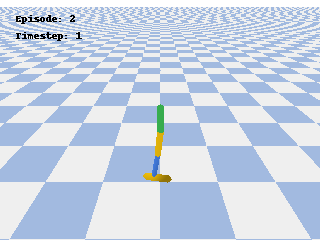

In [15]:
from IPython import display
display.Image(open('/content/drive/MyDrive/Gif/SAC_agent.gif','rb').read())